In [2]:
import pandas as pd
import geopandas as gpd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as cx
import sqlite3

In [7]:
con = sqlite3.connect("biki.db")
trips = pd.read_sql("SELECT * FROM trips", con, parse_dates=["startTime", "endTime"])
stations = pd.read_sql("SELECT * FROM stations", con)

In [10]:
trips.count()

id              93
bikeId          93
startTime       93
startStation    93
endTime         93
endStation      93
duration        93
price           93
bikeObcn        93
bikeModel       93
bikeMsnbc       93
bikeQrCode      93
dtype: int64

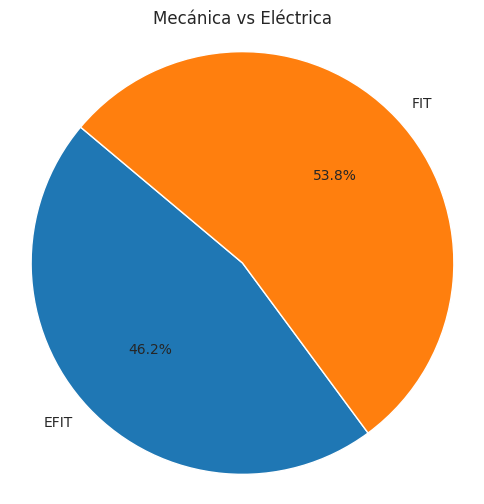

In [16]:
a = trips.groupby(trips["bikeModel"]).count()["id"]
sns.set_style("whitegrid")
plt.figure(figsize=(6,6))
plt.pie(a.values, labels=a.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')
plt.title("Mecánica vs Eléctrica")
plt.show()

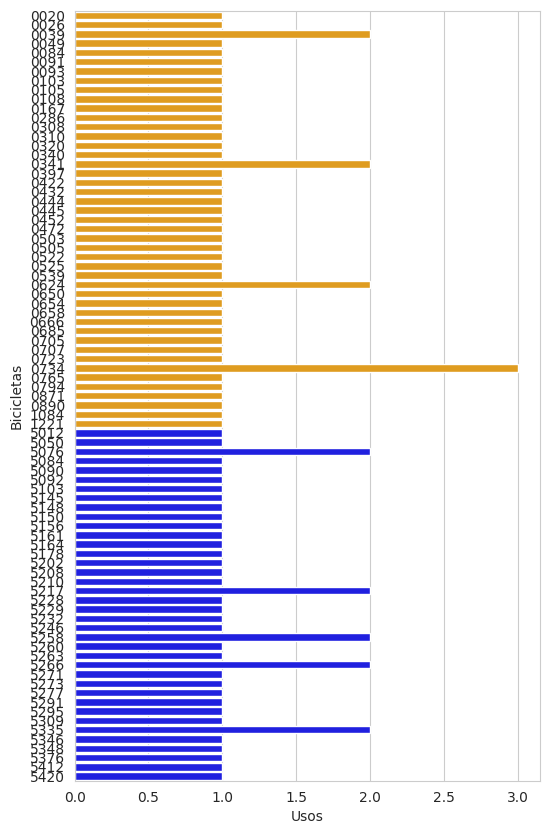

In [25]:
a = trips.groupby([trips["bikeObcn"], trips["bikeModel"]]).agg(count=("id", "count"))
plt.figure(figsize=(6, 10))
palette = {"FIT": "orange", "EFIT": "blue"}
sns.barplot(y="bikeObcn", x="count", hue="bikeModel", data=a, dodge=False, palette=palette)
plt.xlabel("Usos")
plt.ylabel("Bicicletas")
plt.legend().remove()

In [31]:
trips["duration"] = trips["endTime"] - trips["startTime"]

In [32]:
trips.loc[trips["duration"] == trips["duration"].min()]

,id,bikeId,startTime,startStation,endTime,endStation,duration,price,bikeObcn,bikeModel,bikeMsnbc,bikeQrCode
61,795079,441,2024-04-19 10:53:12+00:00,25,2024-04-19 11:00:19+00:00,34,0 days 00:07:07,25,0765,FIT,P38458,ea5acea581


In [33]:
trips.loc[trips["duration"] == trips["duration"].max()]

,id,bikeId,startTime,startStation,endTime,endStation,duration,price,bikeObcn,bikeModel,bikeMsnbc,bikeQrCode
87,1161010,210,2024-09-18 18:50:04+00:00,98,2024-09-18 19:37:31+00:00,25,0 days 00:47:27,0,5229,EFIT,P40080,129db72b11


In [34]:
trips.groupby("bikeModel").agg(mean_time=("duration", "mean"))

,mean_time
bikeModel,
EFIT,0 days 00:19:30.465116279
FIT,0 days 00:16:49.500000


In [35]:
trips["duration"].sum()

Timedelta('1 days 04:00:05')

In [39]:
stations_count = pd.concat([trips["startStation"], trips["endStation"]], ignore_index=True)
stations_count = pd.DataFrame({"id": stations_count})
stations_count = stations_count.groupby("id", as_index=False).agg(count=("id", "count"))
stations_count.sort_values(by="count", ascending=False)

,id,count
13,28,41
27,78,27
10,25,23
31,87,7
12,27,7
11,26,6
25,58,6
14,30,5
7,14,4
4,10,4


In [40]:
stations_data = pd.merge(stations_count, stations, on="id", how="left")
gdf = gpd.GeoDataFrame(stations_data, geometry=gpd.points_from_xy(stations_data["lon"], stations_data["lat"]))
gdf.crs = "EPSG:4326"
gdf["geometry"] = gdf["geometry"].buffer(0.0005+0.0001*gdf["count"])
gdf

/tmp/ipykernel_60433/2136861825.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf["geometry"] = gdf["geometry"].buffer(0.0005+0.0001*gdf["count"])


,id,count,name,lat,lon,address,obcn,capacity,geometry
0,2,1,001 Fuente Dorada,41.652290,-4.726630,Plaza de Fuente Dorada,1,27,"POLYGON ((-4.72603 41.65229, -4.72603 41.65223..."
1,4,3,003 Estación de Tren,41.643311,-4.726401,Calle Recondo,3,26,"POLYGON ((-4.72560 41.64331, -4.72560 41.64323..."
2,8,4,007 Plaza Poniente,41.652800,-4.731540,Plaza del Poniente,7,25,"POLYGON ((-4.73064 41.65280, -4.73064 41.65271..."
3,9,4,008 Paseo Filipinos,41.645182,-4.733784,Paseo Zorrilla 36,8,27,"POLYGON ((-4.73288 41.64518, -4.73289 41.64509..."
4,10,4,009 Plaza Zorrilla,41.648000,-4.729030,Acera de Recoletos1,9,27,"POLYGON ((-4.72813 41.64800, -4.72813 41.64791..."
5,11,1,010 Cadenas de San Gregorio,41.657894,-4.722041,Calle Gondomar20,10,15,"POLYGON ((-4.72144 41.65789, -4.72144 41.65784..."
6,12,3,011 Facultad Medicina,41.654592,-4.716465,Av. Ramon y Cajal4,11,23,"POLYGON ((-4.71566 41.65459, -4.71567 41.65451..."
7,14,4,013 CASA DEL ESTUDIANTE- CLÍNICO,41.657145,-4.717899,Calle Real de Burgos6,13,23,"POLYGON ((-4.71700 41.65715, -4.71700 41.65706..."
8,20,1,019 Angustias,41.655610,-4.723730,Calle de la Angustias15,19,15,"POLYGON ((-4.72313 41.65561, -4.72313 41.65555..."
9,21,2,020 ISABEL LA CATÓLICA,41.650250,-4.732460,Calle Veinte de Febrero11,20,22,"POLYGON ((-4.73176 41.65025, -4.73176 41.65018..."


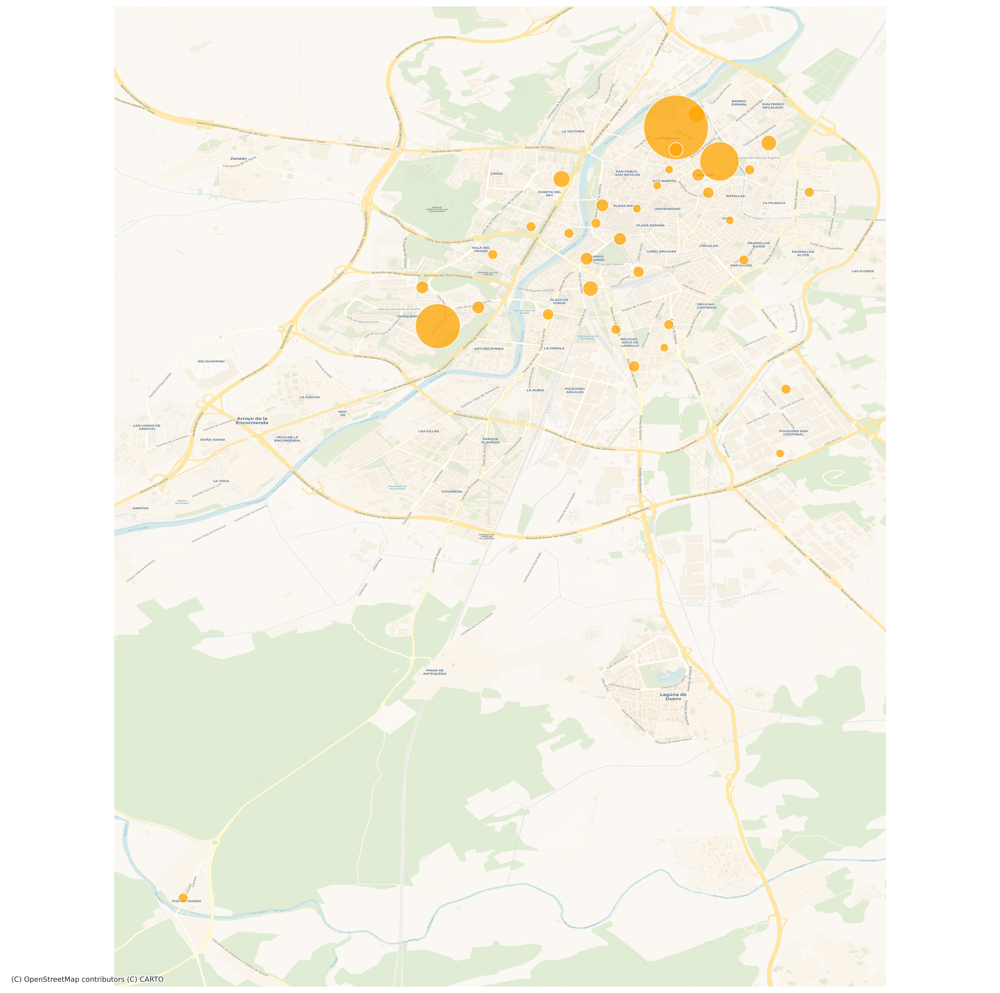

In [41]:
import matplotlib
matplotlib.rcParams['savefig.dpi'] = 300
matplotlib.rcParams["figure.dpi"] = 300
ax = gdf.plot(figsize=(20, 20), color="orange", alpha=0.75)
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.Voyager, zoom=15)
ax.set_axis_off()
plt.axis('equal')
plt.savefig("BikiStats.png")
plt.show()